In [1]:
# %pip install git+https://github.com/espnet/espnet
# %pip install -q espnet_model_zoo

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
from pathlib import Path

import pandas as pd
import numpy as np
import torchaudio
from tqdm.auto import tqdm
import librosa
import noisereduce as nr
import opensmile

from plotly_resampler import FigureResampler
from plotly.subplots import make_subplots
import plotly.express as px

sys.path.append("..")
from sgs_utils.path_conf import (
    loc_data_dir,
    speech_data_session_dir,
    interim_speech_data_dir,
)
from sgs_utils.data_filtering import get_valid_audio_mask

from IPython.display import Audio, display

# https://pytorch.org/audio/stable/backend.html#module-torchaudio.backend
torchaudio.get_audio_backend()


'sox_io'

In [47]:
# Load the session data and only parse the valid sessions
df_session = pd.read_parquet(loc_data_dir.joinpath("df_session_tot_cleaned.parquet"))

df_session_v = df_session[
    get_valid_audio_mask(df_session)
    # TODO -> i do not find that we can already impose here a (strict) duration requirement
    # hence, this 5s only serves as a sanity check (and not as a hard requirement)
    & (df_session.wav_duration_s > 5.5)
]
print(f"{df_session.shape[0]} \ {df_session_v.shape[0]}")
# del df_session


3257 \ 3005


In [56]:
row

age                                                  35
education                                          unif
sex                                              female
timestamp              2020-11-27 12:24:15.790311+01:00
ID                 99d276a0-83fe-4d47-949e-481dc67b2688
Marloes                                               7
PiSCES                                               15
Radboud                                              15
device                                              NaN
prolific_token                                     None
pic_name                                     Picture 98
time_str                                       12:39:48
wav_size                                        5472300
wav_sample_rate                                   44100
wav_duration_s                                    62.04
wav_timestamp                 2020-11-27 12:39:58+01:00
DB                                               PiSCES
arousal                                         

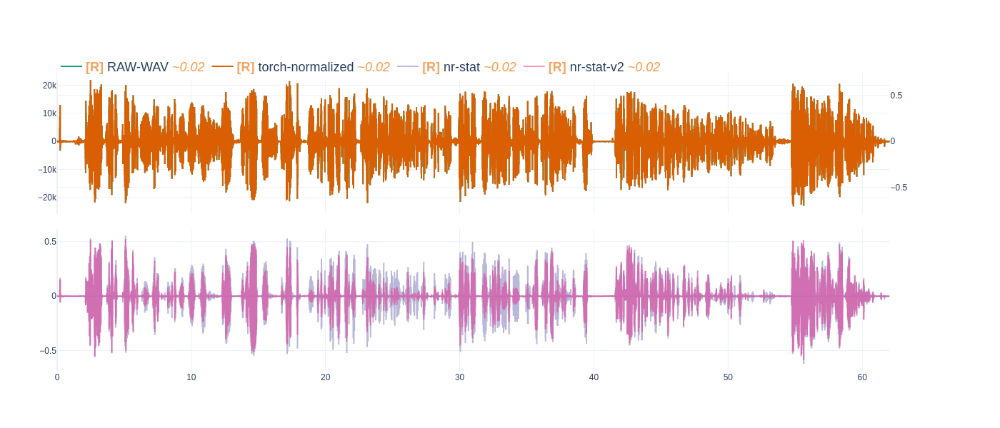

In [51]:
row = df_session_v.iloc[np.random.randint(0, len(df_session_v))]
wav_path: Path = list(
    speech_data_session_dir.glob(
        f"*{row.ID}/{row.DB}/{row.pic_name}__{row.time_str}.wav"
    )
)[0]

# We will re-use the last wav file to perform some normalization and opensmile analysis
arr, fs = torchaudio.load(wav_path, channels_first=True, normalize=False)
t = np.arange(0, arr.shape[1]) / fs
arr = arr.numpy().ravel()

arr_n, _ = torchaudio.load(wav_path, channels_first=True, normalize=True)
arr_n = arr_n.numpy().ravel()

# perform noise removal
# , prop_decrease=0.5, n_std_thresh_stationary=2)
arr_n_nrs = nr.reduce_noise(
    arr_n, sr=fs, stationary=True, n_std_thresh_stationary=1, n_fft=258
)
arr_n_nrs_v2 = nr.reduce_noise(
    arr_n,
    sr=fs,
    stationary=False,
    n_std_thresh_stationary=1,
    time_constant_s=5,
    n_fft=258,
)


# -------------------- Construct the figure --------------------
if True:
    fr = FigureResampler(
        make_subplots(
            rows=2,
            shared_xaxes=True,
            vertical_spacing=0.05,
            specs=[[{"secondary_y": True}]] * 2,
        ),
        default_n_shown_samples=2500,
    )
    # Row 1: raw (+ normalized wav)
    fr.add_trace({"name": "RAW-WAV"}, hf_y=arr, hf_x=t, row=1, col=1)
    fr.add_trace(
        {"name": "torch-normalized"}, hf_y=arr_n, hf_x=t, col=1, row=1, secondary_y=True
    )

    fr.add_trace(
        {"name": "nr-stat", "opacity": 0.5}, hf_y=arr_n_nrs, hf_x=t, col=1, row=2
    )
    fr.add_trace(
        {"name": "nr-stat-v2", "opacity": 0.5}, hf_y=arr_n_nrs_v2, hf_x=t, col=1, row=2
    )

    fr.update_layout(
        legend=dict(orientation="h", y=1.06, xanchor="left", x=0, font=dict(size=18)),
        height=600,
        colorway=px.colors.qualitative.Dark2,
        template="plotly_white",
    )
    fr.show(renderer="png", width=1400)
    # fr.show_dash(mode="inline", port=8050)


In [52]:
start, stop = 11, 15
print("raw:")
display(Audio(data=arr[start * fs : stop * fs], rate=fs, autoplay=False))
print("normalized: stationary noise reduction:")
display(Audio(data=arr_n_nrs[start * fs : stop * fs], rate=fs, autoplay=False))
print("normalized: stationary noise reduction V2:")
display(Audio(data=arr_n_nrs_v2[start * fs : stop * fs], rate=fs, autoplay=False))


raw:


normalized: stationary noise reduction:


normalized: stationary noise reduction V2:


In [53]:
# !gdown --id 17DMWdw84wF3fz3t7ia1zssdzhkpVQGZm -O /content/chime_tasnet_singlechannel.zip
# !unzip /content/chime_tasnet_singlechannel.zip -d /content/enh_model_sc
# cfg = {
#     "train_config": "/content/enh_model_sc/exp/enh_train_enh_conv_tasnet_raw/config.yaml",
#     "model_file": "/content/enh_model_sc/exp/enh_train_enh_conv_tasnet_raw/5epoch.pth",
# }

##########################################################
# If the above command failed, try the following instead #
##########################################################
from espnet_model_zoo.downloader import ModelDownloader

d = ModelDownloader()
cfg = d.download_and_unpack("espnet/Wangyou_Zhang_chime4_enh_train_enh_conv_tasnet_raw")

In [54]:
# Load the model
# If you encounter error "No module named 'espnet2'", please re-run the 1st Cell. This might be a colab bug.
import sys
import soundfile
from espnet2.bin.enh_inference import SeparateSpeech


separate_speech = {}
# For models downloaded from GoogleDrive, you can use the following script:
enh_model_sc = SeparateSpeech(
    train_config=cfg["train_config"],
    model_file=cfg["model_file"],
    # for segment-wise process on long speech
    normalize_segment_scale=False,
    show_progressbar=True,
    ref_channel=4,
    normalize_output_wav=True,
    device="cuda:0",
)


In [55]:
# play the enhanced single-channel speech
wave = enh_model_sc(arr[None, ...], fs)
print("Input real noisy speech", flush=True)
display(Audio(arr, rate=fs))
print("Enhanced speech", flush=True)
display(Audio(wave[0].squeeze(), rate=fs))

/home/jonas/.cache/pypoetry/virtualenvs/semi-guided-speech-27YL4uf1-py3.8/lib/python3.8/site-packages/espnet2/enh/encoder/conv_encoder.py:45: UserWarning:

__floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').



Input real noisy speech


Enhanced speech


In [57]:
from speechbrain.pretrained import WaveformEnhancement
enhancer = WaveformEnhancement.from_hparams(
    source="speechbrain/mtl-mimic-voicebank",
    savedir="tmpdir",

)

In [58]:
enhanced = enhancer.enhance_file(str(wav_path))

In [59]:
fs / (arr.shape[0] / enhanced.size()[0])

15996.977919161678

In [60]:
Audio(enhanced, rate=16_000)